In [5]:
%config InlineBackend.figure_format='retina'

In [6]:
import warnings
warnings.filterwarnings("ignore")

In [7]:
import re
import os 
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns


Bad key "text.kerning_factor" on line 4 in
/opt/miniconda3/envs/py37/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
http://github.com/matplotlib/matplotlib/blob/master/matplotlibrc.template
or from the matplotlib source distribution


# Загрузка данных

In [8]:
Data = pd.read_csv("../Probe_Data/Febraury_PredData.csv", index_col=0)

In [9]:
def SetShiftTarget(Data, delta):
    """
    Сдвигает изначальный таргет на delta шагов назад
    Шаг дискретизации по времени : 5 минут
    """
    Data['shift_target'] = Data.target.shift(-delta).values
    Data.fillna(0, inplace=True)
    return Data

In [10]:
inds = Data[Data["Вибрация переднего подшипника двигателя (осевая)"] < 10.0].index
Data['target'][inds] = 1.0
Data = SetShiftTarget(Data, 36)

X = Data.drop(['target', 'shift_target'], axis=1)
y = Data['shift_target']

# Подготовка данных

In [11]:
from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()

ScaledData = pd.DataFrame(mms.fit_transform(X), columns=X.columns, index=X.index)

In [12]:
import plotly.graph_objects as go
import plotly.express as px

config = dict({'scrollZoom': True})

import pandas as pd
sens_name_1 = ScaledData.columns[12]
sens_name_2 = ScaledData.columns[13]

Sens_1 = ScaledData[sens_name_1].values
Sens_2 = ScaledData[sens_name_2].values

fig = go.Figure()

fig.add_traces([
    go.Scatter(x=ScaledData.index,
               y=Sens_1,
               name="Вибрация ЗПД (осев.)"),
    go.Scatter(x=ScaledData.index,
               y=Sens_2,
               name="Вибрация ЗПД (рад.)"),
    go.Scatter(x=ScaledData.index,
               y=Data.target.values,
               fill="tozerox",
               name="Остановки"),
])

#==========================================================================================#

# fig.update_xaxes(rangeslider_visible=True)
fig.show(config=config)
# fig.write_html("Febraury_XGBoost_Results.html", config=config)

## Интервальная стандартизация

In [11]:
from sklearn.preprocessing import StandardScaler

In [ ]:
StandardScaler()

In [88]:
from itertools import chain

def removing_spaces(sl):
    try:
        sl.remove("")
    except:
        return sl
    return sl

def get_intervals(timeseries, stoppings):
    """
    Получает на вход временной ряд показаний датчиков, (timeseries)
    и делит их на массив интервалов между остановками (stoppings)
    """
    
    mapped_stops = list(map(lambda x: " " if x==0 else "\t", stoppings))
    merged_stops = ''.join([str(t)+s for t,s in zip(timeseries, mapped_stops)])
    
    intervals = [ removing_spaces(x.split(' ')) for x in merged_stops.split('\t')]
    intervals = [list(map(float, sl)) for sl in intervals]
    
    
    return intervals

def preprocess_intervals(intervals):
    """
    Полученные интервалы приводятся к нулевому среднему
    и единичной дисперсии
    """
    result = []

    if len(intervals[0]) < 3:
        _whole_interval = list(chain(*intervals))
        _mean, _std = np.mean(_whole_interval), np.std(_whole_interval)
    
    for interval in intervals:
#         print(len(interval))
        if len(interval) >= 3:
            _mean, _std = np.mean(interval), np.std(interval)
            interval = [(val - _mean) / _std for val in interval]
            result += interval
        else : 
            interval = [(val - _mean) / _std for val in interval]
            result += interval

    return np.array(result)

In [92]:
intervals = get_intervals(Data.iloc[:,12], Data.target)

In [95]:
import plotly.graph_objects as go
import plotly.express as px

config = dict({'scrollZoom': True})

import pandas as pd
sens_name_1 = ScaledData.columns[12]
sens_name_2 = ScaledData.columns[13]

Sens_1 = preprocess_intervals(get_intervals(Data[sens_name_1], Data.target))  #ScaledData[sens_name_1].values
Sens_2 = preprocess_intervals(get_intervals(Data[sens_name_2], Data.target))#ScaledData[sens_name_2].values

fig = go.Figure()

fig.add_traces([
    go.Scatter(x=ScaledData.index,
               y=Sens_1,
               name="Вибрация ЗПД (осев.)"),
    go.Scatter(x=ScaledData.index,
               y=Sens_2,
               name="Вибрация ЗПД (рад.)"),
    go.Scatter(x=ScaledData.index,
               y=Data.target.values,
               fill="tozerox",
               name="Остановки"),
])

#==========================================================================================#

# fig.update_xaxes(rangeslider_visible=True)
fig.show(config=config)
# fig.write_html("Febraury_XGBoost_Results.html", config=config)

In [97]:
for col in X.columns:
    prep_vals = preprocess_intervals(get_intervals(X[col], Data.target))
    X[col] = prep_vals

## Генерация фичей

### Попарные корреляции

In [98]:
WINDOW_SIZE = 20

corr_X = X.rolling(window = WINDOW_SIZE).corr()

In [99]:
from itertools import product, combinations

Sensors_Combs = list(combinations(X.columns, r=2))
CorrFeatures = pd.DataFrame()

for sens_1, sens_2 in Sensors_Combs:

    # Выбираем из датафрейма, корреляцию за все время пары датчиков `sens_1` и `sens_2`
    corr_series = corr_X[sens_1].loc[:, sens_2]

    # Так как использовалась оконная функция в начале есть пропуски
    # Заполним их случайными величинами из диапазона [MIN, MAX] для данного ряда
    MAX, MIN = corr_series.max(), corr_series.min()
    fill_values = np.random.sample(size=WINDOW_SIZE - 1) * (MAX - MIN) + MIN
    corr_series[:WINDOW_SIZE - 1] = fill_values

    # Все такие новые колонки с попарными корреляциями датчиков
    # Будут начинаться с `Corr_`
    corr_series.name = '_'.join(['Corr', sens_1, sens_2])

    CorrFeatures = pd.concat([CorrFeatures, corr_series], axis=1)

### TDA

In [100]:
from ripser import Rips
from persim import PersImage

In [101]:
from tqdm.notebook import tqdm


def get_point_cloud(timeseries, window_size=36, window_step=4):
    PC = np.array([
        timeseries[i:i + window_size].to_list()
        for i in range(0,
                       len(timeseries) - window_size, window_step)
    ])
    return PC


def get_TDA_features(timeseries, window_size=144):

    TopologicalFeatures = []
    err_cnt = 0
    for i in tqdm(range(0,
                        len(timeseries) - window_size),
                  total=len(timeseries) - window_size):

        PointCloud = get_point_cloud(timeseries=timeseries[i:i + window_size],
                                     window_size=36)

        rips = Rips(maxdim=1, coeff=2, verbose=False)
        T_Data = rips.fit_transform(PointCloud)[-1]

        try:
            Mean_LifeTime = (T_Data[:, 1] - T_Data[:, 0]).mean()
            Std_LifeTime = (T_Data[:, 1] - T_Data[:, 0]).std()
            Max_LifeTime = (T_Data[:, 1] - T_Data[:, 0]).max()
            Min_LifeTime = (T_Data[:, 1] - T_Data[:, 0]).min()
        except:
            err_cnt += 1
            Mean_LifeTime, Std_LifeTime, Max_LifeTime, Min_LifeTime = np.nan, np.nan, np.nan, np.nan

        TopologicalFeatures.append(
            [Mean_LifeTime, Std_LifeTime, Max_LifeTime, Min_LifeTime])
    print(f"Errors : {err_cnt}")

    TopologicalFeatures = np.array(TopologicalFeatures)
    TopologicalFeatures = np.pad(TopologicalFeatures,
                                 pad_width=((window_size, 0), (0, 0)))

    return np.array(TopologicalFeatures)

In [102]:
TDA_Features = pd.DataFrame()

feature_columns = ["LT_mean", "LT_std", "LT_max", "LT_min"]
for SensName in Data.columns[:-2]:
    _TS = Data[SensName]
    print(SensName)
    _TDA = pd.DataFrame(get_TDA_features(_TS),
                        columns=[f"{feature}_{SensName}" for feature in feature_columns])
    print("="*20)
    
    TDA_Features = pd.concat([TDA_Features, _TDA], axis=1)
    
TDA_Features.index = Data.index

Температура обмотки статора А (датчик №1)



Errors : 90
Температура обмотки статора А (датчик №2)



Errors : 87
Температура обмотки статора В (датчик №1)



Errors : 79
Температура обмотки статора В (датчик №2)



Errors : 78
Температура обмотки статора С (датчик №1)



Errors : 294
Температура обмотки статора С (датчик №2)



Errors : 325
Температура переднего подшипника двигателя



Errors : 514
Температура заднего подшипника двигателя



Errors : 1447
Давление в масляном домкрате (передний подшипник)



Errors : 301
Давление в масляном домкрате (задний подшипник)



Errors : 1747
Вибрация переднего подшипника двигателя (осевая)



Errors : 305
Вибрация переднего подшипника двигателя (радиальная)



Errors : 352
Вибрация заднего подшипника двигателя (осевая)



Errors : 459
Вибрация заднего подшипника двигателя (радиальная)



Errors : 416


## Объединение признаков

In [103]:
X = pd.concat([X, CorrFeatures, TDA_Features], axis=1)

## Заполнение NaN

<AxesSubplot:>

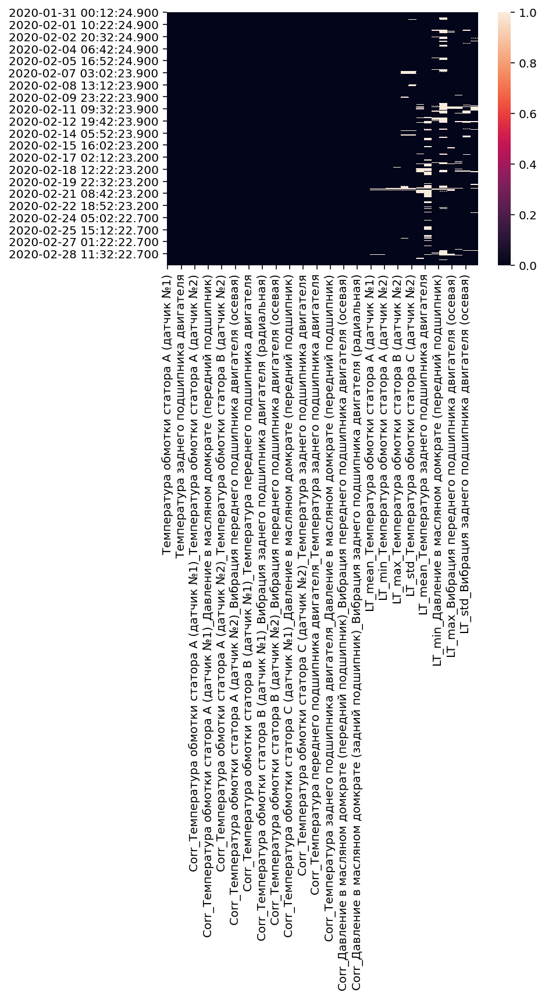

In [104]:
sns.heatmap(X.isna())

In [105]:
from sklearn.impute import SimpleImputer, KNNImputer

imputer = KNNImputer()
X = pd.DataFrame(imputer.fit_transform(X), columns=X.columns, index=X.index)

<AxesSubplot:>

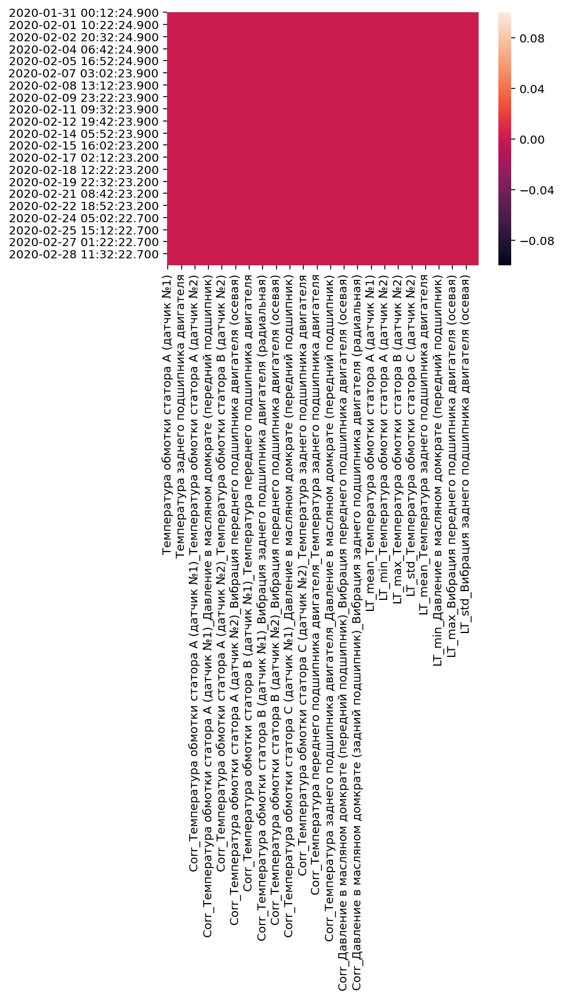

In [107]:
sns.heatmap(X.isna())

## Разбивка на Val / Exam

In [108]:
Val_X, Exam_X = X.loc[:"2020-02-20"], X.loc["2020-02-20":]
Val_y, Exam_y = y.loc[:"2020-02-20"], y.loc["2020-02-20":]

# Классификатор аномалий

In [109]:
from xgboost import XGBRegressor, XGBRFRegressor, XGBClassifier, XGBRFClassifier

from sklearn.model_selection import cross_validate, train_test_split
from sklearn.metrics import jaccard_similarity_score as IoU
from sklearn.metrics import classification_report, roc_auc_score, f1_score

## XGBoost Random Forest

### Подбор параметров на кросс-валидации

In [110]:
from tqdm.notebook import tqdm

Params = {
    "n_estimators": 10,
    "max_depth": 3,
    "booster": 'gbtree',
    "n_jobs": -1
}

N_EST_ARR = range(100, 160, 10)
MAX_DEPTH_ARR = range(2, 9)

param_comb = list(product(N_EST_ARR, MAX_DEPTH_ARR))
best_f1, best_roc_auc, best_jaccard = 0.0, 0.0, 0.0
RESULTS = []

for n_est, max_depth in tqdm(param_comb):

    Params['n_estimators'] = n_est
    Params['max_depth'] = max_depth

    CLF = XGBRFClassifier(**Params)
    CV_result = cross_validate(
        CLF,
        Val_X,
        Val_y,
        scoring=['f1', 'roc_auc', 'jaccard_weighted'],
        return_train_score=True,
        return_estimator=True)

    #======================================================================#
    # Сохранение результатов и метрик
    #======================================================================#
    res = dict()
    res['params'] = Params

    for part, metric in product(["train", "test"],
                                ["f1", "roc_auc", "jaccard_weighted"]):
        res[f"{part}_avg_{metric}"] = CV_result[f"{part}_{metric}"].mean()
        res[f"{part}_std_{metric}"] = CV_result[f"{part}_{metric}"].std()

    if res["test_avg_jaccard_weighted"] > best_jaccard:
        best_jaccard = res["test_avg_jaccard_weighted"]
        best_est = CV_result["estimator"]

    RESULTS.append(res)

    #======================================================================#

In [111]:
RESULTS = pd.DataFrame(RESULTS)
RESULTS

,params,train_avg_f1,train_std_f1,train_avg_roc_auc,train_std_roc_auc,train_avg_jaccard_weighted,train_std_jaccard_weighted,test_avg_f1,test_std_f1,test_avg_roc_auc,test_std_roc_auc,test_avg_jaccard_weighted,test_std_jaccard_weighted
0,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.093908,0.078707,0.833658,0.029811,0.889029,0.004803,0.000000,0.000000,0.469401,0.151971,0.882288,0.002188
1,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.191552,0.076942,0.890858,0.024430,0.895559,0.005645,0.000000,0.000000,0.457266,0.159226,0.878858,0.005601
2,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.429824,0.130549,0.928837,0.018316,0.915578,0.012216,0.037918,0.047373,0.466073,0.153257,0.864452,0.021228
3,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.636226,0.138045,0.956496,0.015422,0.938497,0.015847,0.060258,0.060063,0.475683,0.155123,0.845637,0.041833
4,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.750805,0.107826,0.975611,0.011307,0.953901,0.014815,0.061053,0.056621,0.480769,0.151504,0.843336,0.043221
5,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.799466,0.092767,0.986451,0.006851,0.961299,0.014047,0.058993,0.056924,0.479004,0.150216,0.836572,0.043221
6,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.849726,0.053947,0.991966,0.004218,0.969247,0.009304,0.065435,0.059768,0.467690,0.154794,0.833808,0.043797
7,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.091493,0.076366,0.834438,0.029909,0.888865,0.004642,0.000000,0.000000,0.465722,0.153732,0.882125,0.002504
8,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.185534,0.078521,0.892310,0.024088,0.895148,0.005706,0.000000,0.000000,0.457985,0.158332,0.877879,0.006566
9,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.428173,0.140645,0.929018,0.019382,0.915536,0.013029,0.034289,0.044626,0.467380,0.154297,0.865165,0.020377


<AxesSubplot:title={'center':'Test Score / Train Score'}>

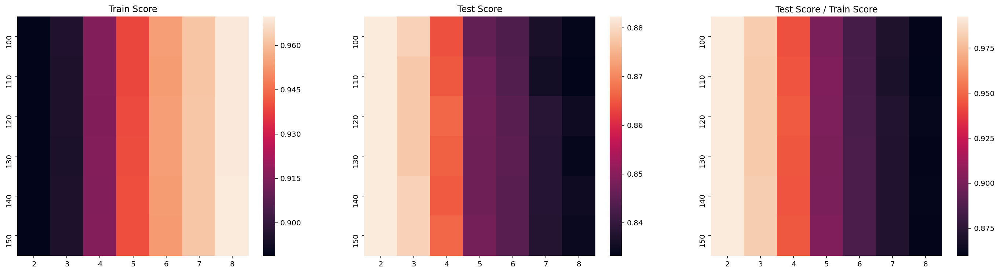

In [112]:
AVG_Train_Jaccard = RESULTS['train_avg_jaccard_weighted'].values.reshape(
    len(N_EST_ARR), len(MAX_DEPTH_ARR))
AVG_Test_Jaccard = RESULTS['test_avg_jaccard_weighted'].values.reshape(
    len(N_EST_ARR), len(MAX_DEPTH_ARR))

fig, axes = plt.subplots(1, 3, figsize=(24, 6))

axes[0].set_title("Train Score")
sns.heatmap(AVG_Train_Jaccard,
            xticklabels=MAX_DEPTH_ARR,
            yticklabels=N_EST_ARR,
            ax=axes[0])

axes[1].set_title("Test Score")
sns.heatmap(AVG_Test_Jaccard,
            xticklabels=MAX_DEPTH_ARR,
            yticklabels=N_EST_ARR,
            ax=axes[1])

axes[2].set_title("Test Score / Train Score")
sns.heatmap(AVG_Test_Jaccard / AVG_Train_Jaccard,
            xticklabels=MAX_DEPTH_ARR,
            yticklabels=N_EST_ARR,
            ax=axes[2])

In [113]:
for i, clf in enumerate(best_est):
    ValPreds = clf.predict(Val_X)
    ExamPreds = clf.predict(Exam_X)
    ValProbs = clf.predict_proba(Val_X)
    ExamProbs = clf.predict_proba(Exam_X)

    print(60 * "=")
    print(f"{i+1}-й Классификатор")
    print(60 * "=")

    print("Val Report:\n")
    print(classification_report(Val_y, ValPreds))
    print("Exam Report:\n")
    print(classification_report(Exam_y, ExamPreds))



1-й Классификатор
Val Report:

              precision    recall  f1-score   support

         0.0       0.94      1.00      0.97      5412
         1.0       0.73      0.07      0.13       346

    accuracy                           0.94      5758
   macro avg       0.84      0.53      0.55      5758
weighted avg       0.93      0.94      0.92      5758

Exam Report:

              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98      2717
         1.0       0.88      0.12      0.21       125

    accuracy                           0.96      2842
   macro avg       0.92      0.56      0.60      2842
weighted avg       0.96      0.96      0.95      2842

2-й Классификатор
Val Report:

              precision    recall  f1-score   support

         0.0       0.94      1.00      0.97      5412
         1.0       0.00      0.00      0.00       346

    accuracy                           0.94      5758
   macro avg       0.47      0.50      0.48      575

<ErrorbarContainer object of 3 artists>

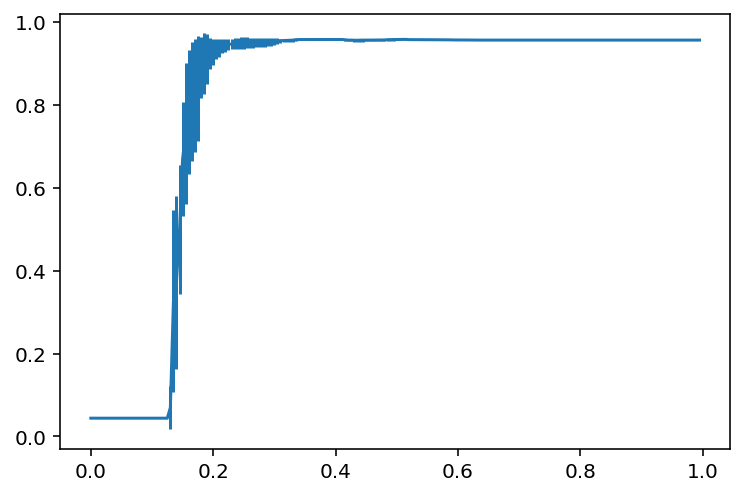

In [114]:
def predict(clf, thrs, X):
    return (clf.predict_proba(X)[:,1] > thrs).astype(int)

Metrics = []
for thrs in tqdm(np.arange(0.0, 1.0, 0.005)):
    clf_metrics = []
    for clf in best_est:
        preds = predict(clf, thrs, Exam_X)
        clf_metrics.append(IoU(Exam_y, preds))
    Metrics.append(clf_metrics)
    
Metrics = np.array(Metrics)

plt.errorbar(np.arange(0.0, 1.0, 0.005), Metrics.mean(axis=1), Metrics.std(axis=1))

### Визуализация важности признаков

In [115]:
FeatureImportances = sorted(zip(X.columns, clf.feature_importances_), 
                            key = lambda x: x[1], reverse=True)

TDA_FI = [fi for fi in FeatureImportances if fi[0].startswith('LT_')]
CorrFI = [fi for fi in FeatureImportances if fi[0].startswith('Corr_')]
InitFI = sorted(set(FeatureImportances) - set(CorrFI) - set(TDA_FI), key=lambda x: x[1], reverse=True)

#### Отдельно каждый тип признаков

<BarContainer object of 14 artists>

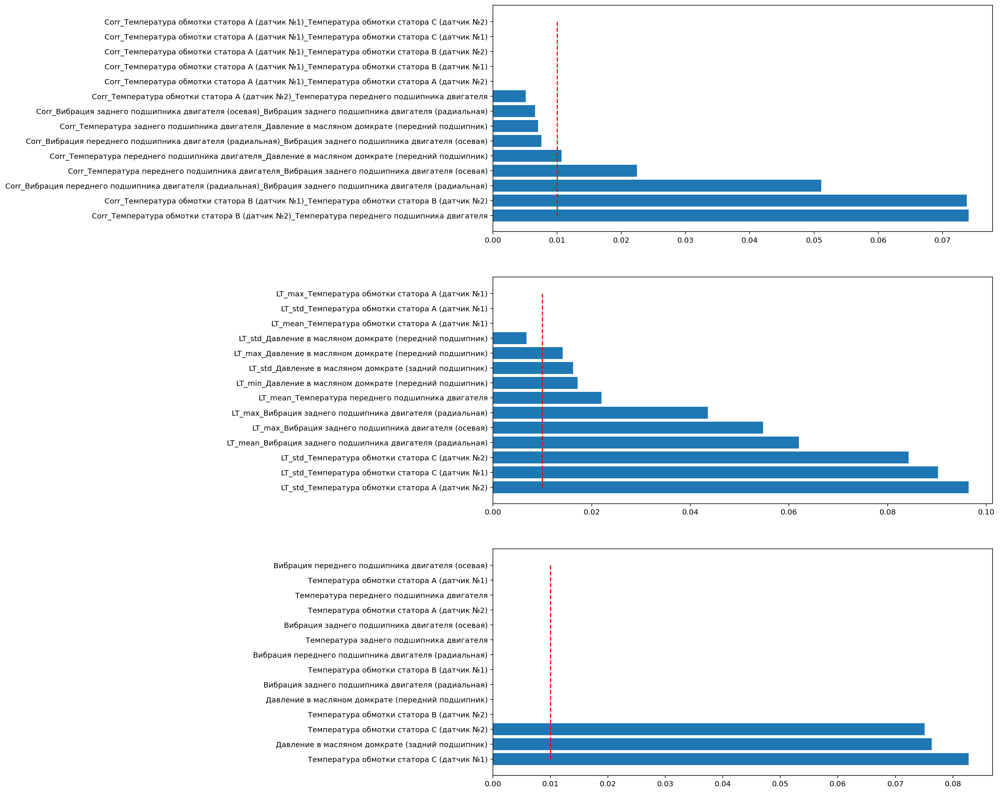

In [116]:
fig, axes = plt.subplots(3, 1, figsize=(12, 19))

TOP_N = 14

axes[0].vlines(0.01, 1, TOP_N, colors='red', linestyle='dashed')
axes[0].barh(range(1, TOP_N + 1), [fi[1] for fi in CorrFI[:TOP_N]],
             tick_label=[fi[0] for fi in CorrFI[:TOP_N]])

axes[1].vlines(0.01, 1, TOP_N, colors='red', linestyle='dashed')
axes[1].barh(range(1, TOP_N + 1), [fi[1] for fi in TDA_FI[:TOP_N]],
             tick_label=[fi[0] for fi in TDA_FI[:TOP_N]])

axes[2].vlines(0.01, 1, TOP_N, colors='red', linestyle='dashed')
axes[2].barh(range(1, TOP_N + 1), [fi[1] for fi in InitFI[:TOP_N]],
             tick_label=[fi[0] for fi in InitFI[:TOP_N]])

#### Общий ТОП признаков

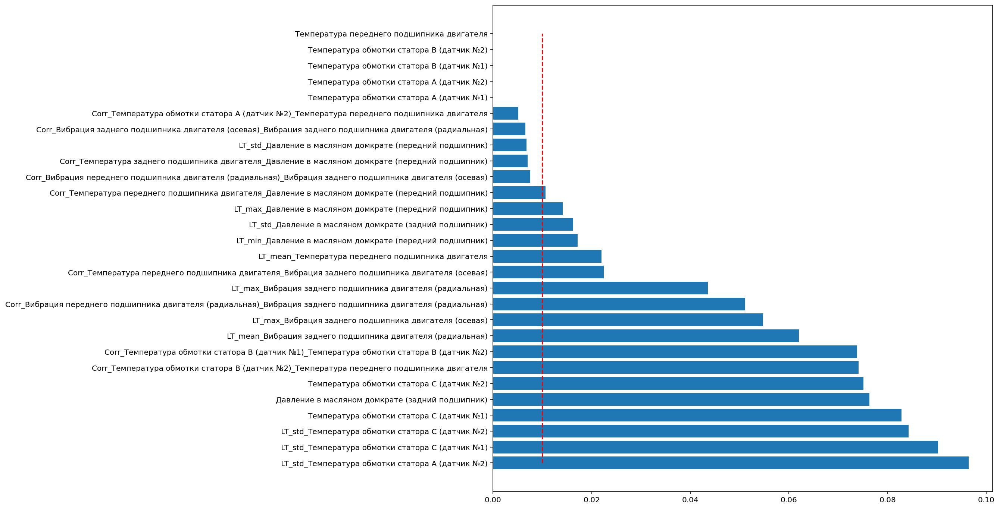

In [117]:
plt.figure(figsize=(12, 12))
plt.vlines(0.01, 1, 2 * TOP_N, colors='red', linestyle='dashed')
plt.barh(range(1, 2 * TOP_N + 1),
         [fi[1] for fi in FeatureImportances[:2 * TOP_N]],
         tick_label=[fi[0] for fi in FeatureImportances[:2 * TOP_N]])
plt.show()

### Визуализация предсказаний

In [118]:
from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()

ScaledData = pd.DataFrame(mms.fit_transform(X), columns=X.columns, index=X.index)
ScaledValData = pd.DataFrame(mms.fit_transform(Val_X), columns=Val_X.columns, index=Val_X.index)
ScaledExamData = pd.DataFrame(mms.fit_transform(Exam_X), columns=Exam_X.columns, index=Exam_X.index)

Probs = pd.Series(np.concatenate([ValProbs[:,1], ExamProbs[:,1]]), index=X.index)

In [119]:
import plotly.graph_objects as go
import plotly.express as px

config = dict({'scrollZoom': True})

import pandas as pd
sens_name_1 = ScaledData.columns[12]
sens_name_2 = ScaledData.columns[13]

Sens_1 = ScaledData[sens_name_1].values
Sens_2 = ScaledData[sens_name_2].values

fig = go.Figure()
fig.add_trace(go.Scatter(x=ScaledData.index, y=Sens_1, name="Вибрация ЗПД (осев.)"))
fig.add_trace(go.Scatter(x=ScaledData.index, y=Sens_2, name="Вибрация ЗПД (рад.)"))
fig.add_traces([
    go.Scatter(x=ScaledData.index,
               y=Data.target.values, 
               fill="tozerox",
               name="Остановки"),
    go.Scatter(x=ScaledData.index,
               y=Probs,
               fill="tozeroy",
               name="Уровень опасности"),
])

#==========================================================================================#

# fig.update_xaxes(rangeslider_visible=True)
fig.show(config=config)
# fig.write_html("Febraury_XGBoost_Results.html", config=config)